# Ali - Group 25 - Exploratory Data Analysis script
 This script contains the exploratory data analysis
 as a preliminary to the subsequent Modelling.R
 script. This was also assisted by the following
 functions from the PBA lab3DataPreprocessing.R script:
 - N

# Setup

## Imports

In [4]:
# clears console
cat("\014")

# seed for reproducibility
set.seed(123)

# clear all environment variables
rm(list=ls())

In [59]:
# Loads the libraries
MYLIBRARIES<-c("outliers",
               "caret",
               "randomForest",
               "corrplot",
               "MASS",
               "formattable",
               "stats",
               "tidyr",
               "ggplot2",
               "GGally",
               "dplyr",
               "VIM",
               "PerformanceAnalytics",
               "Rtsne",
               "umap",
               "plotly",
               "dbscan"
               )
library(pacman)
pacman::p_load(char=MYLIBRARIES,install=TRUE,character.only=TRUE)

# load pre-processing helper functions
source("Preprocess.R")
source("lab3DataPrep.R")

Installing package into '/Users/alishihab/Library/R/arm64/4.3/library'
(as 'lib' is unspecified)




The downloaded binary packages are in
	/var/folders/sc/1szcwj896vj46hym37x0wkzc0000gn/T//Rtmpp2M7A8/downloaded_packages



dbscan installed



## Definitions - Constants

In [6]:
# ************************************************
# CONSTANTS
# ************************************************

# datasets - these were split into train and test
# by the original provider, and will be combined
TRAIN_FILENAME <- "train.csv"
TEST_FILENAME <- "test.csv"
TARGET_FIELD <- "satisfaction"

## Load Datasets

In [7]:
  # read in data and combine
  data <- readData(TRAIN_FILENAME, TEST_FILENAME)

[1] "CSV data read. Records= 129880"


# Data Exploration & Preprocessing

## Descriptive Statistics

In [8]:
  # descriptive structure & statistics
  str(data)
  head(data)

'data.frame':	129880 obs. of  25 variables:
 $ X                             : int  0 1 2 3 4 5 6 7 8 9 ...
 $ id                            : int  70172 5047 110028 24026 119299 111157 82113 96462 79485 65725 ...
 $ Gender                        : chr  "Male" "Male" "Female" "Female" ...
 $ CustomerType                  : chr  "Loyal Customer" "disloyal Customer" "Loyal Customer" "Loyal Customer" ...
 $ Age                           : int  13 25 26 25 61 26 47 52 41 20 ...
 $ TypeofTravel                  : chr  "Personal Travel" "Business travel" "Business travel" "Business travel" ...
 $ Class                         : chr  "Eco Plus" "Business" "Business" "Business" ...
 $ FlightDistance                : int  460 235 1142 562 214 1180 1276 2035 853 1061 ...
 $ Inflightwifiservice           : int  3 3 2 2 3 3 2 4 1 3 ...
 $ DepartureArrivaltimeconvenient: int  4 2 2 5 3 4 4 3 2 3 ...
 $ EaseofOnlinebooking           : int  3 3 2 5 3 2 2 4 2 3 ...
 $ Gatelocation                  : i

,X,id,Gender,CustomerType,Age,TypeofTravel,Class,FlightDistance,Inflightwifiservice,DepartureArrivaltimeconvenient,...,Inflightentertainment,Onboardservice,Legroomservice,Baggagehandling,Checkinservice,Inflightservice,Cleanliness,DepartureDelayinMinutes,ArrivalDelayinMinutes,satisfaction
,<int>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<chr>
1,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18,neutral or dissatisfied
2,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6,neutral or dissatisfied
3,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0,satisfied
4,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9,neutral or dissatisfied
5,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0,satisfied
6,5,111157,Female,Loyal Customer,26,Personal Travel,Eco,1180,3,4,...,1,3,4,4,4,4,1,0,0,neutral or dissatisfied


In [9]:
  # determine number of unique values of each field
  getUniqueValues(data)

  # determine field types
  fieldTypes<-getColumnTypes(data)

X                             id 
                        103904                         129880 
                        Gender                   CustomerType 
                             2                              2 
                           Age                   TypeofTravel 
                            75                              2 
                         Class                 FlightDistance 
                             3                           3821 
           Inflightwifiservice DepartureArrivaltimeconvenient 
                             6                              6 
           EaseofOnlinebooking                   Gatelocation 
                             6                              6 
                  Foodanddrink                 Onlineboarding 
                             6                              6 
                   Seatcomfort          Inflightentertainment 
                             6                              6 
                Onboardservice                 Legroomservice 
                             6                              6 
               Baggagehandling                 Checkinservice 
                             5                              6 
               Inflightservice                    Cleanliness 
                             6                              6 
       DepartureDelayinMinutes          ArrivalDelayinMinutes 
                           466                            473 
                  satisfaction 
                             2

[1] "number of numeric fields= 20"
$X
[1] "NUMERIC"

$id
[1] "NUMERIC"

$Age
[1] "NUMERIC"

$FlightDistance
[1] "NUMERIC"

$Inflightwifiservice
[1] "NUMERIC"

$DepartureArrivaltimeconvenient
[1] "NUMERIC"

$EaseofOnlinebooking
[1] "NUMERIC"

$Gatelocation
[1] "NUMERIC"

$Foodanddrink
[1] "NUMERIC"

$Onlineboarding
[1] "NUMERIC"

$Seatcomfort
[1] "NUMERIC"

$Inflightentertainment
[1] "NUMERIC"

$Onboardservice
[1] "NUMERIC"

$Legroomservice
[1] "NUMERIC"

$Baggagehandling
[1] "NUMERIC"

$Checkinservice
[1] "NUMERIC"

$Inflightservice
[1] "NUMERIC"

$Cleanliness
[1] "NUMERIC"

$DepartureDelayinMinutes
[1] "NUMERIC"

$ArrivalDelayinMinutes
[1] "NUMERIC"

[1] "number of symbolic fields= 5"
$Gender
[1] "SYMBOLIC"

$CustomerType
[1] "SYMBOLIC"

$TypeofTravel
[1] "SYMBOLIC"

$Class
[1] "SYMBOLIC"

$satisfaction
[1] "SYMBOLIC"



## Remove Duplicates

In [10]:
filtered_data <- data[!duplicated(data), ]

In [11]:
  str(data)

'data.frame':	129880 obs. of  25 variables:
 $ X                             : int  0 1 2 3 4 5 6 7 8 9 ...
 $ id                            : int  70172 5047 110028 24026 119299 111157 82113 96462 79485 65725 ...
 $ Gender                        : chr  "Male" "Male" "Female" "Female" ...
 $ CustomerType                  : chr  "Loyal Customer" "disloyal Customer" "Loyal Customer" "Loyal Customer" ...
 $ Age                           : int  13 25 26 25 61 26 47 52 41 20 ...
 $ TypeofTravel                  : chr  "Personal Travel" "Business travel" "Business travel" "Business travel" ...
 $ Class                         : chr  "Eco Plus" "Business" "Business" "Business" ...
 $ FlightDistance                : int  460 235 1142 562 214 1180 1276 2035 853 1061 ...
 $ Inflightwifiservice           : int  3 3 2 2 3 3 2 4 1 3 ...
 $ DepartureArrivaltimeconvenient: int  4 2 2 5 3 4 4 3 2 3 ...
 $ EaseofOnlinebooking           : int  3 3 2 5 3 2 2 4 2 3 ...
 $ Gatelocation                  : i

In [12]:
  # determine number of unique values of each field
  getUniqueValues(filtered_data)

X                             id 
                        103904                         129880 
                        Gender                   CustomerType 
                             2                              2 
                           Age                   TypeofTravel 
                            75                              2 
                         Class                 FlightDistance 
                             3                           3821 
           Inflightwifiservice DepartureArrivaltimeconvenient 
                             6                              6 
           EaseofOnlinebooking                   Gatelocation 
                             6                              6 
                  Foodanddrink                 Onlineboarding 
                             6                              6 
                   Seatcomfort          Inflightentertainment 
                             6                              6 
                Onboardservice                 Legroomservice 
                             6                              6 
               Baggagehandling                 Checkinservice 
                             5                              6 
               Inflightservice                    Cleanliness 
                             6                              6 
       DepartureDelayinMinutes          ArrivalDelayinMinutes 
                           466                            473 
                  satisfaction 
                             2

## Remove ID Fields

In [13]:
data <- subset(data, select = -c(X, id))

In [14]:
head(data)

,Gender,CustomerType,Age,TypeofTravel,Class,FlightDistance,Inflightwifiservice,DepartureArrivaltimeconvenient,EaseofOnlinebooking,Gatelocation,...,Inflightentertainment,Onboardservice,Legroomservice,Baggagehandling,Checkinservice,Inflightservice,Cleanliness,DepartureDelayinMinutes,ArrivalDelayinMinutes,satisfaction
,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<chr>
1,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18,neutral or dissatisfied
2,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6,neutral or dissatisfied
3,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0,satisfied
4,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9,neutral or dissatisfied
5,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0,satisfied
6,Female,Loyal Customer,26,Personal Travel,Eco,1180,3,4,2,1,...,1,3,4,4,4,4,1,0,0,neutral or dissatisfied


In [15]:
 # statistical summary
 summary(data)

    Gender          CustomerType            Age        TypeofTravel      
 Length:129880      Length:129880      Min.   : 7.00   Length:129880     
 Class :character   Class :character   1st Qu.:27.00   Class :character  
 Mode  :character   Mode  :character   Median :40.00   Mode  :character  
                                       Mean   :39.43                     
                                       3rd Qu.:51.00                     
                                       Max.   :85.00                     
                                                                         
    Class           FlightDistance Inflightwifiservice
 Length:129880      Min.   :  31   Min.   :0.000      
 Class :character   1st Qu.: 414   1st Qu.:2.000      
 Mode  :character   Median : 844   Median :3.000      
                    Mean   :1190   Mean   :2.729      
                    3rd Qu.:1744   3rd Qu.:4.000      
                    Max.   :4983   Max.   :5.000      
                       

In [16]:
  # determine field types
  fieldTypes<-getColumnTypes(data)

[1] "number of numeric fields= 18"
$Age
[1] "NUMERIC"

$FlightDistance
[1] "NUMERIC"

$Inflightwifiservice
[1] "NUMERIC"

$DepartureArrivaltimeconvenient
[1] "NUMERIC"

$EaseofOnlinebooking
[1] "NUMERIC"

$Gatelocation
[1] "NUMERIC"

$Foodanddrink
[1] "NUMERIC"

$Onlineboarding
[1] "NUMERIC"

$Seatcomfort
[1] "NUMERIC"

$Inflightentertainment
[1] "NUMERIC"

$Onboardservice
[1] "NUMERIC"

$Legroomservice
[1] "NUMERIC"

$Baggagehandling
[1] "NUMERIC"

$Checkinservice
[1] "NUMERIC"

$Inflightservice
[1] "NUMERIC"

$Cleanliness
[1] "NUMERIC"

$DepartureDelayinMinutes
[1] "NUMERIC"

$ArrivalDelayinMinutes
[1] "NUMERIC"

[1] "number of symbolic fields= 5"
$Gender
[1] "SYMBOLIC"

$CustomerType
[1] "SYMBOLIC"

$TypeofTravel
[1] "SYMBOLIC"

$Class
[1] "SYMBOLIC"

$satisfaction
[1] "SYMBOLIC"



In [17]:
unique(data$Class)

[1] "Eco Plus" "Business" "Eco"

In [18]:
# display descriptive statistics
NPREPROCESSING_prettyDataset(data)

## Missing Values

In [19]:
  # check missing values
  missing_values_summary <- colSums(is.na(data))
  print(missing_values_summary)

                        Gender                   CustomerType 
                             0                              0 
                           Age                   TypeofTravel 
                             0                              0 
                         Class                 FlightDistance 
                             0                              0 
           Inflightwifiservice DepartureArrivaltimeconvenient 
                             0                              0 
           EaseofOnlinebooking                   Gatelocation 
                             0                              0 
                  Foodanddrink                 Onlineboarding 
                             0                              0 
                   Seatcomfort          Inflightentertainment 
                             0                              0 
                Onboardservice                 Legroomservice 
                             0                         

In [20]:
  # check proportion of missing vals in each column
  missing_percentage <- colSums(is.na(
    data)) / nrow(data) * 100
  print(missing_percentage)

                        Gender                   CustomerType 
                      0.000000                       0.000000 
                           Age                   TypeofTravel 
                      0.000000                       0.000000 
                         Class                 FlightDistance 
                      0.000000                       0.000000 
           Inflightwifiservice DepartureArrivaltimeconvenient 
                      0.000000                       0.000000 
           EaseofOnlinebooking                   Gatelocation 
                      0.000000                       0.000000 
                  Foodanddrink                 Onlineboarding 
                      0.000000                       0.000000 
                   Seatcomfort          Inflightentertainment 
                      0.000000                       0.000000 
                Onboardservice                 Legroomservice 
                      0.000000                       0.

In [21]:
# Function to impute median
impute_median <- function(dataframe) {
  dataframe %>%
    mutate_if(is.numeric, function(x) {
      ifelse(is.na(x), median(x, na.rm = TRUE), x)
    })
}

In [22]:
# Apply the function to the dataset
data <- impute_median(data)

In [23]:
  # check proportion of missing vals in each column
  missing_percentage <- colSums(is.na(
    data)) / nrow(data) * 100
  print(missing_percentage)

                        Gender                   CustomerType 
                             0                              0 
                           Age                   TypeofTravel 
                             0                              0 
                         Class                 FlightDistance 
                             0                              0 
           Inflightwifiservice DepartureArrivaltimeconvenient 
                             0                              0 
           EaseofOnlinebooking                   Gatelocation 
                             0                              0 
                  Foodanddrink                 Onlineboarding 
                             0                              0 
                   Seatcomfort          Inflightentertainment 
                             0                              0 
                Onboardservice                 Legroomservice 
                             0                         

## Convert categoricals to binary factors

In [24]:
data <- data %>%
  mutate_if(is.character, as.factor)

In [25]:
data <- data %>%
  mutate(across(where(~is.factor(.) && nlevels(.) == 2), ~as.numeric(as.factor(.)) - 1))

In [26]:
str(data)

'data.frame':	129880 obs. of  23 variables:
 $ Gender                        : num  1 1 0 0 1 0 1 0 0 1 ...
 $ CustomerType                  : num  0 1 0 0 0 0 0 0 0 1 ...
 $ Age                           : int  13 25 26 25 61 26 47 52 41 20 ...
 $ TypeofTravel                  : num  1 0 0 0 0 1 1 0 0 0 ...
 $ Class                         : Factor w/ 3 levels "Business","Eco",..: 3 1 1 1 1 2 2 1 1 2 ...
 $ FlightDistance                : int  460 235 1142 562 214 1180 1276 2035 853 1061 ...
 $ Inflightwifiservice           : int  3 3 2 2 3 3 2 4 1 3 ...
 $ DepartureArrivaltimeconvenient: int  4 2 2 5 3 4 4 3 2 3 ...
 $ EaseofOnlinebooking           : int  3 3 2 5 3 2 2 4 2 3 ...
 $ Gatelocation                  : int  1 3 2 5 3 1 3 4 2 4 ...
 $ Foodanddrink                  : int  5 1 5 2 4 1 2 5 4 2 ...
 $ Onlineboarding                : int  3 3 5 2 5 2 2 5 3 3 ...
 $ Seatcomfort                   : int  5 1 5 2 5 1 2 5 3 3 ...
 $ Inflightentertainment         : int  5 1 5 2 3 1 2 

In [27]:
# convert class to numeric
data <- data %>%
  mutate(Class = as.numeric(Class))

In [28]:
str(data)

'data.frame':	129880 obs. of  23 variables:
 $ Gender                        : num  1 1 0 0 1 0 1 0 0 1 ...
 $ CustomerType                  : num  0 1 0 0 0 0 0 0 0 1 ...
 $ Age                           : int  13 25 26 25 61 26 47 52 41 20 ...
 $ TypeofTravel                  : num  1 0 0 0 0 1 1 0 0 0 ...
 $ Class                         : num  3 1 1 1 1 2 2 1 1 2 ...
 $ FlightDistance                : int  460 235 1142 562 214 1180 1276 2035 853 1061 ...
 $ Inflightwifiservice           : int  3 3 2 2 3 3 2 4 1 3 ...
 $ DepartureArrivaltimeconvenient: int  4 2 2 5 3 4 4 3 2 3 ...
 $ EaseofOnlinebooking           : int  3 3 2 5 3 2 2 4 2 3 ...
 $ Gatelocation                  : int  1 3 2 5 3 1 3 4 2 4 ...
 $ Foodanddrink                  : int  5 1 5 2 4 1 2 5 4 2 ...
 $ Onlineboarding                : int  3 3 5 2 5 2 2 5 3 3 ...
 $ Seatcomfort                   : int  5 1 5 2 5 1 2 5 3 3 ...
 $ Inflightentertainment         : int  5 1 5 2 3 1 2 5 1 2 ...
 $ Onboardservice        

## Subsample 10,000 samples

In [48]:
sampled <- sample_n(data, 10000)

In [46]:
numeric_df <- sampled %>%
  select_if(is.numeric)

## Normalise by Z-score

In [51]:
str(sampled)

'data.frame':	10000 obs. of  23 variables:
 $ Gender                        : num  1 0 0 1 0 0 1 0 1 0 ...
 $ CustomerType                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Age                           : int  34 27 64 46 55 67 39 46 60 30 ...
 $ TypeofTravel                  : num  0 1 1 0 1 1 1 0 0 0 ...
 $ Class                         : num  2 2 2 1 2 2 2 2 1 2 ...
 $ FlightDistance                : int  222 1744 719 3947 944 770 2172 353 1851 705 ...
 $ Inflightwifiservice           : int  4 3 3 5 0 2 4 4 3 4 ...
 $ DepartureArrivaltimeconvenient: int  2 4 4 5 2 4 4 1 3 2 ...
 $ EaseofOnlinebooking           : int  2 3 2 5 0 2 4 5 3 1 ...
 $ Gatelocation                  : int  2 2 4 5 4 3 4 1 3 1 ...
 $ Foodanddrink                  : int  4 3 5 3 2 5 1 4 2 4 ...
 $ Onlineboarding                : int  4 3 4 5 4 3 4 2 5 4 ...
 $ Seatcomfort                   : int  4 4 4 5 3 3 5 2 3 4 ...
 $ Inflightentertainment         : int  4 3 3 4 3 5 1 4 5 4 ...
 $ Onboardservice          

In [52]:
normalized <- sampled %>%
  mutate(across(-satisfaction,scale))

In [54]:
str(normalized)

'data.frame':	10000 obs. of  23 variables:
 $ Gender                        : num [1:10000, 1] 1.015 -0.985 -0.985 1.015 -0.985 ...
  ..- attr(*, "scaled:center")= num 0.492
  ..- attr(*, "scaled:scale")= num 0.5
 $ CustomerType                  : num [1:10000, 1] -0.465 -0.465 -0.465 -0.465 -0.465 ...
  ..- attr(*, "scaled:center")= num 0.178
  ..- attr(*, "scaled:scale")= num 0.382
 $ Age                           : num [1:10000, 1] -0.353 -0.818 1.638 0.443 1.04 ...
  ..- attr(*, "scaled:center")= num 39.3
  ..- attr(*, "scaled:scale")= num 15.1
 $ TypeofTravel                  : num [1:10000, 1] -0.667 1.499 1.499 -0.667 1.499 ...
  ..- attr(*, "scaled:center")= num 0.308
  ..- attr(*, "scaled:scale")= num 0.462
 $ Class                         : num [1:10000, 1] 0.663 0.663 0.663 -0.939 0.663 ...
  ..- attr(*, "scaled:center")= num 1.59
  ..- attr(*, "scaled:scale")= num 0.624
 $ FlightDistance                : num [1:10000, 1] -0.978 0.542 -0.481 2.742 -0.257 ...
  ..- attr(*, "s

# Visualisation

## Distributions

### Hist of Distributions

[[1]]

[[2]]


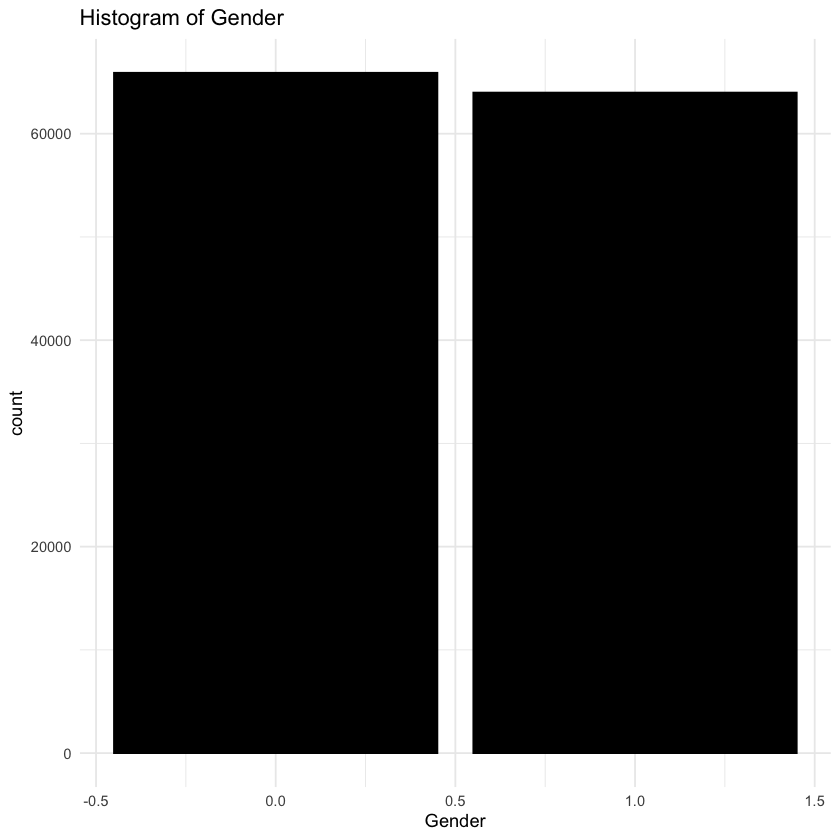


[[3]]


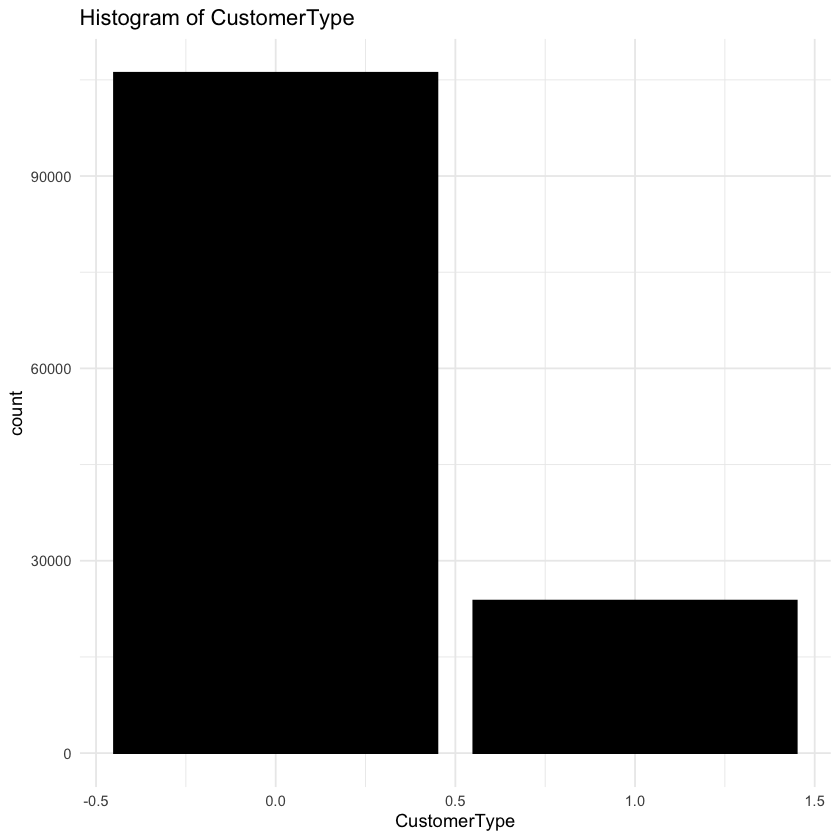


[[4]]


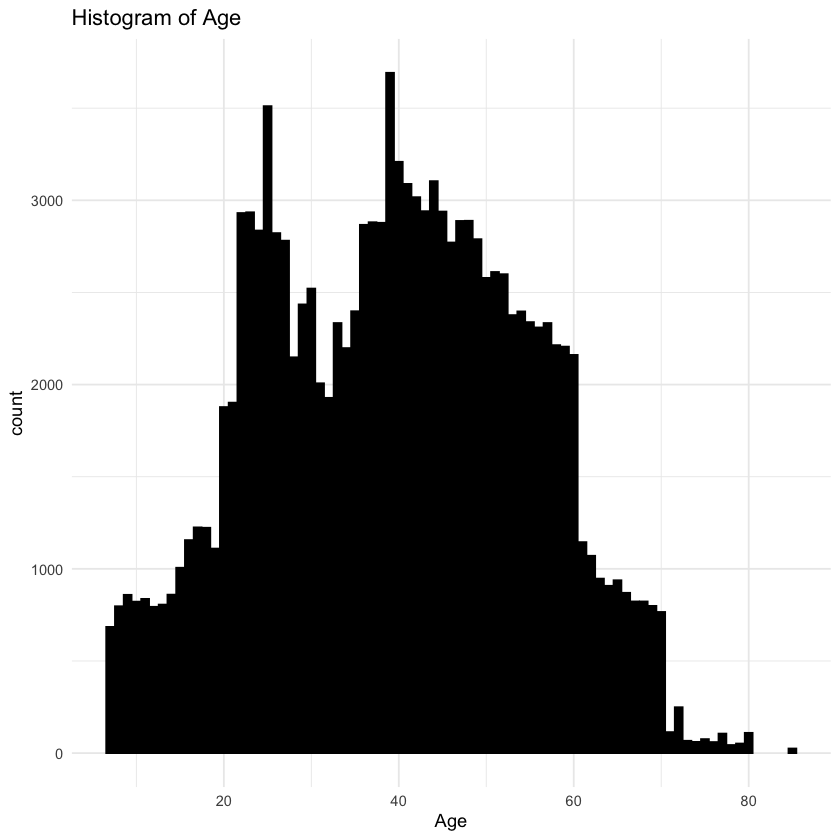


[[5]]


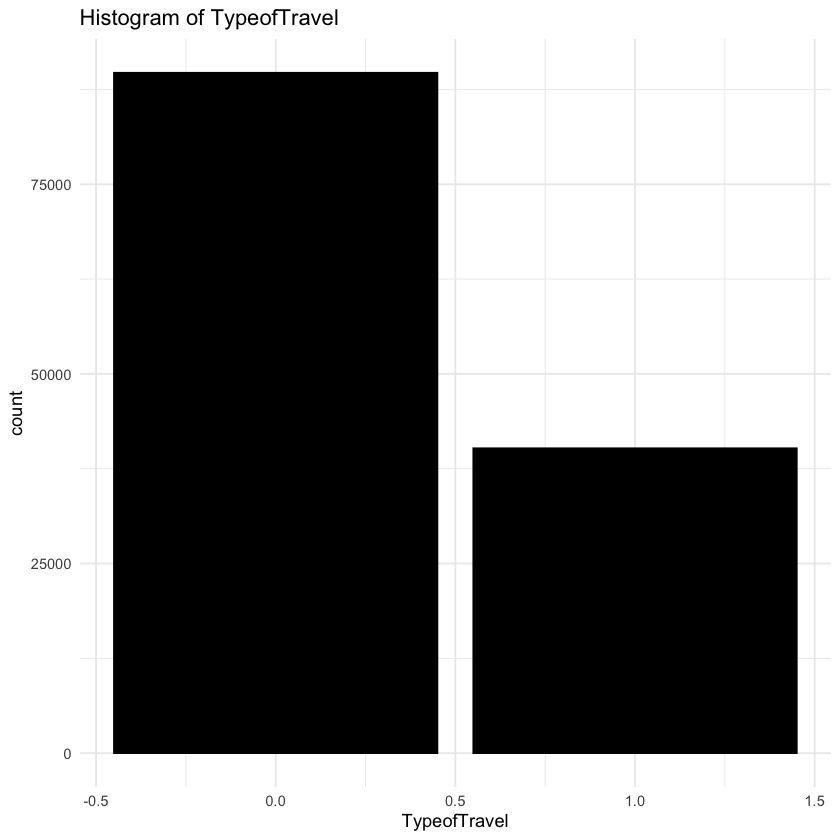


[[6]]


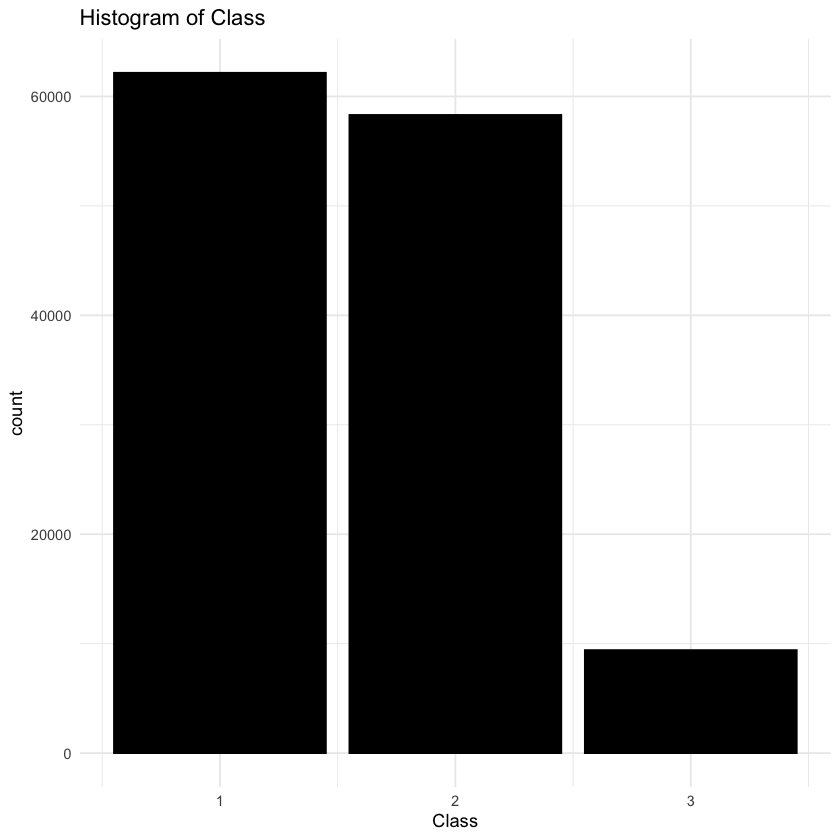


[[7]]


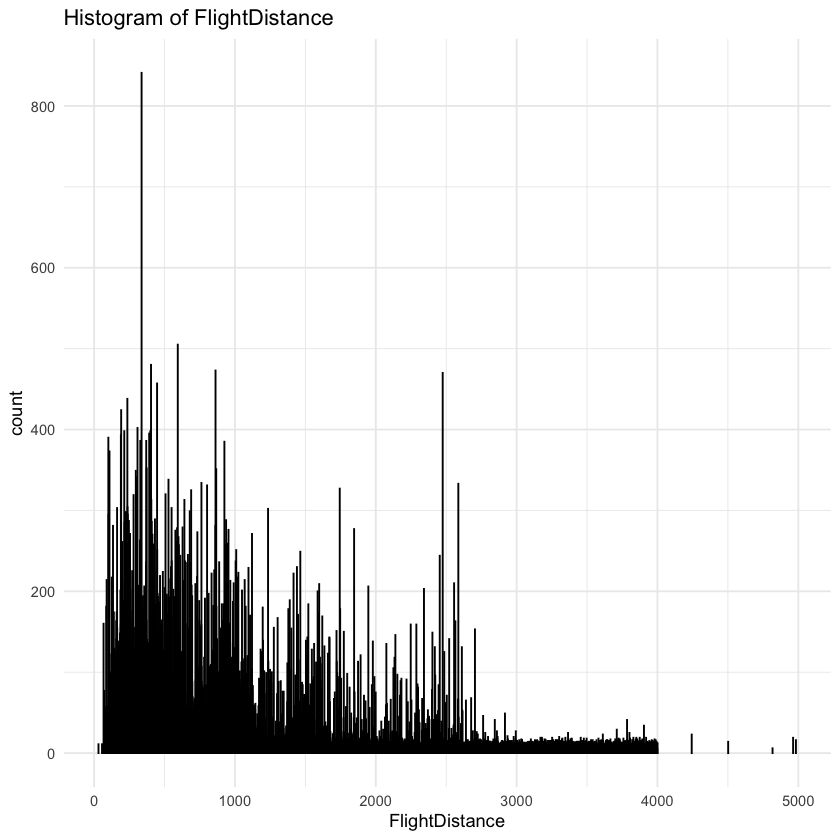


[[8]]


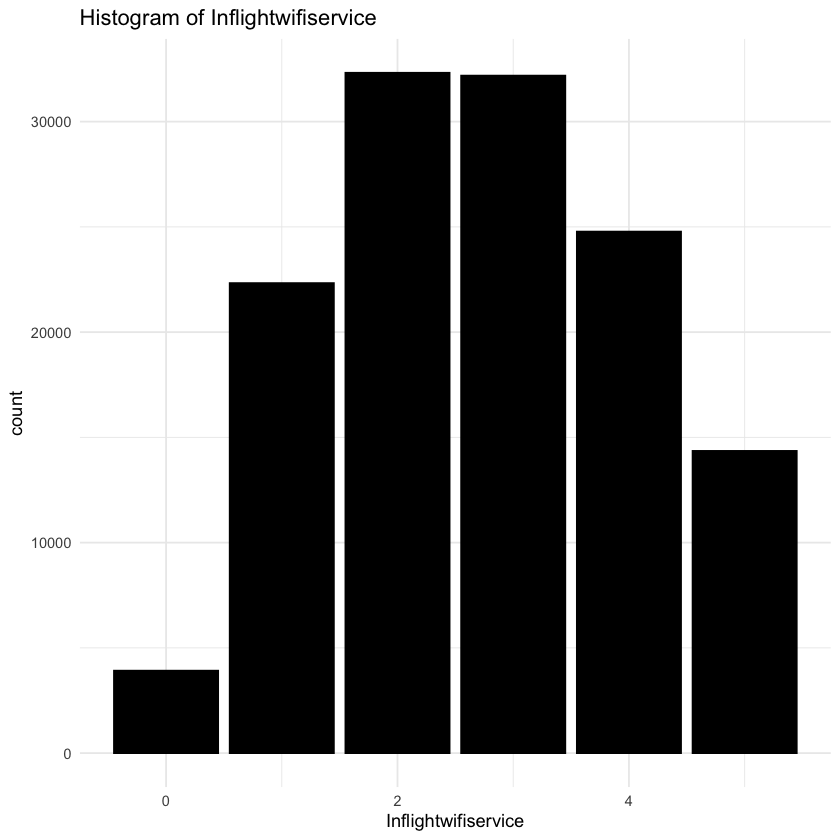


[[9]]


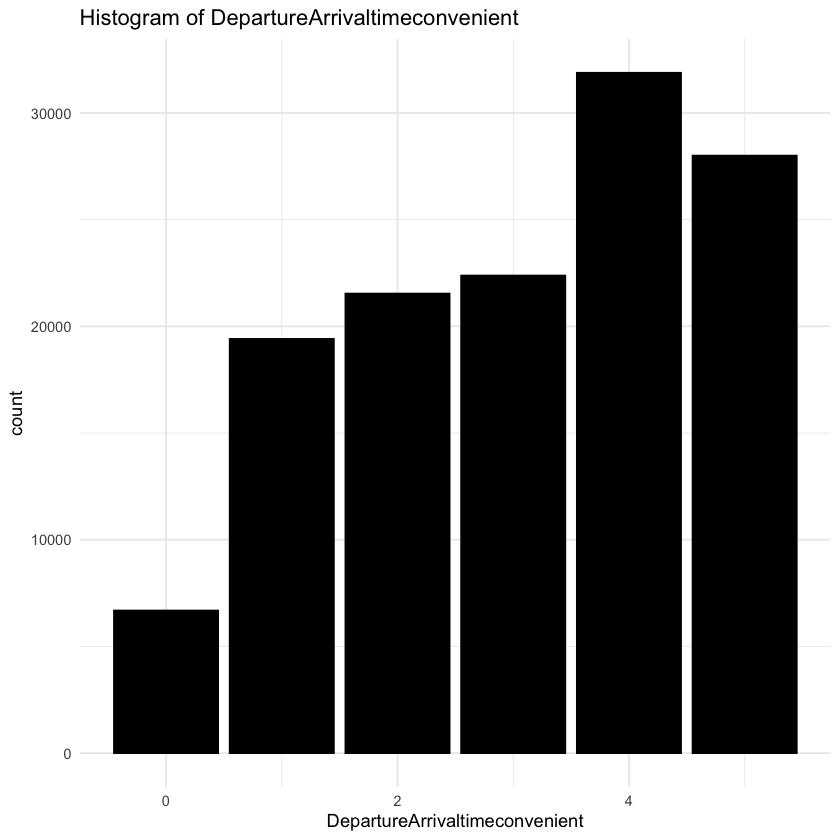


[[10]]


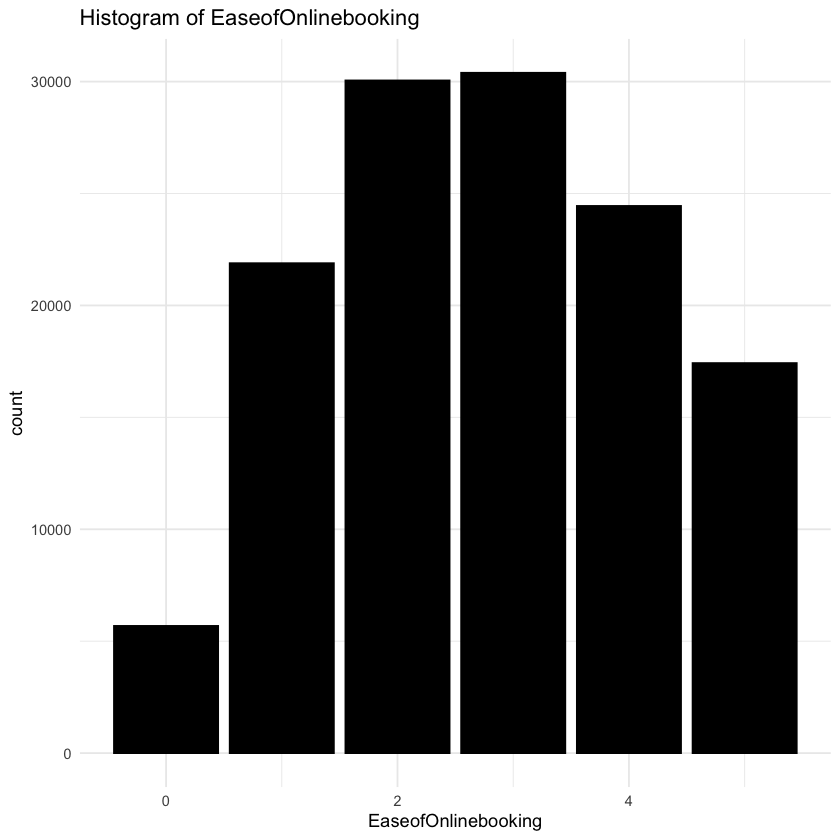


[[11]]


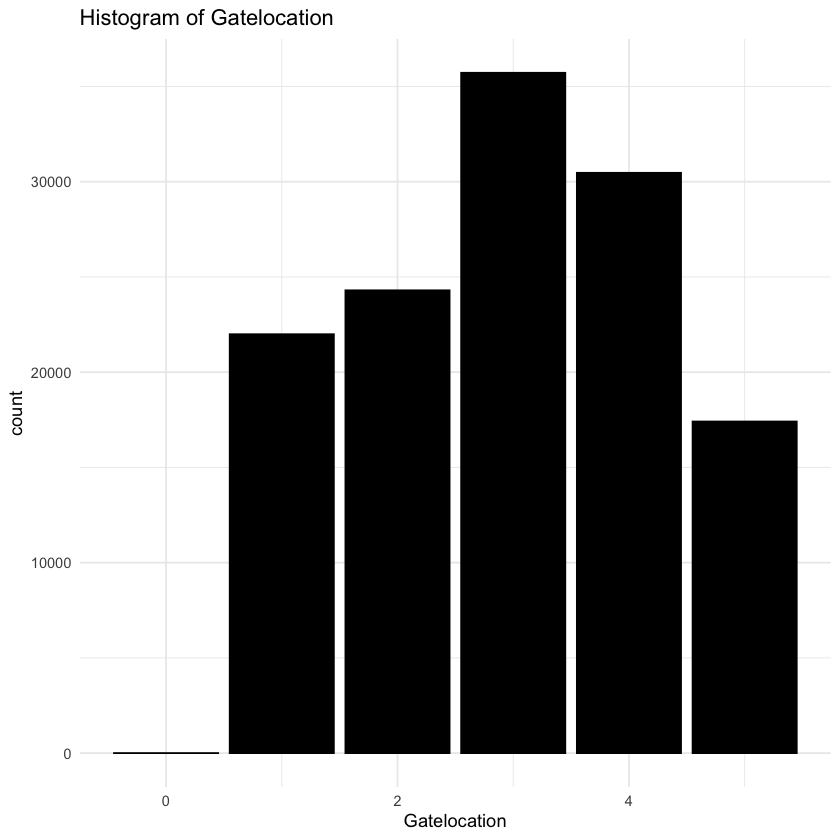


[[12]]


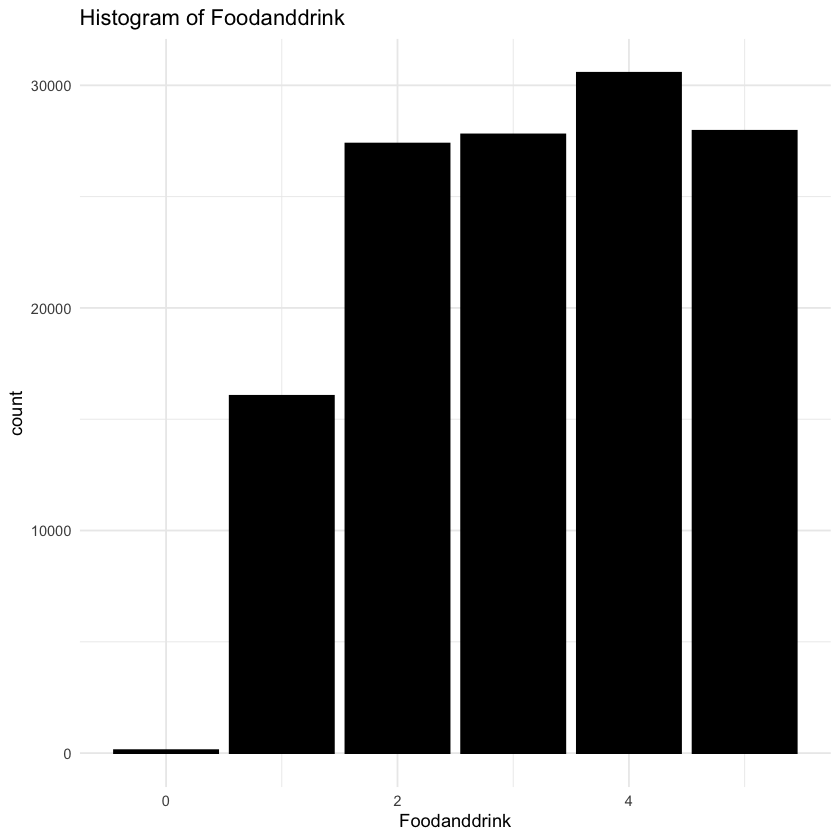


[[13]]


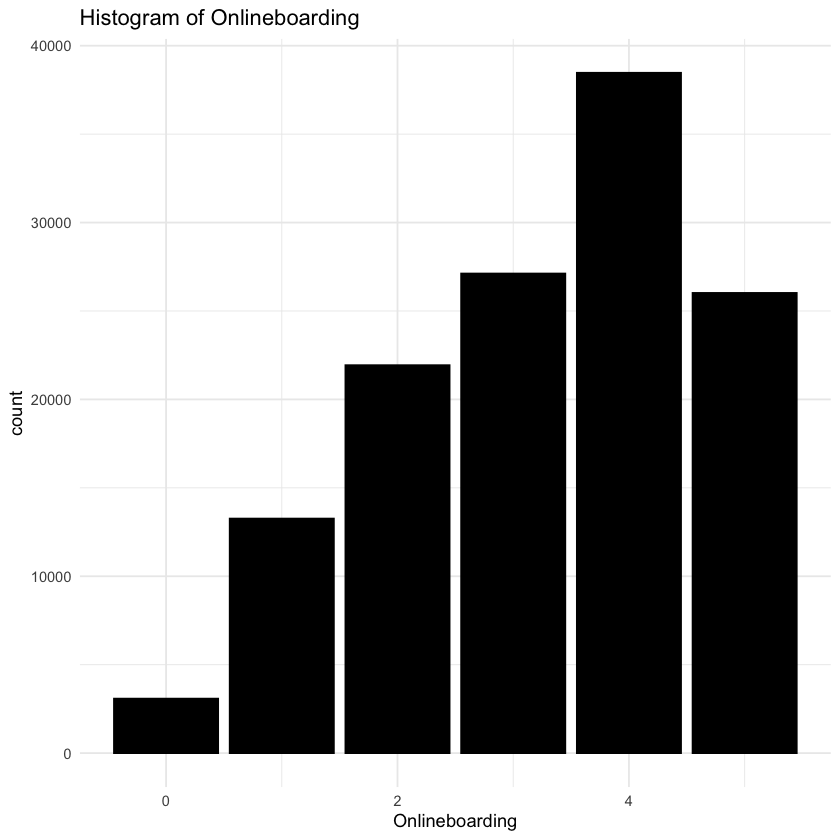


[[14]]


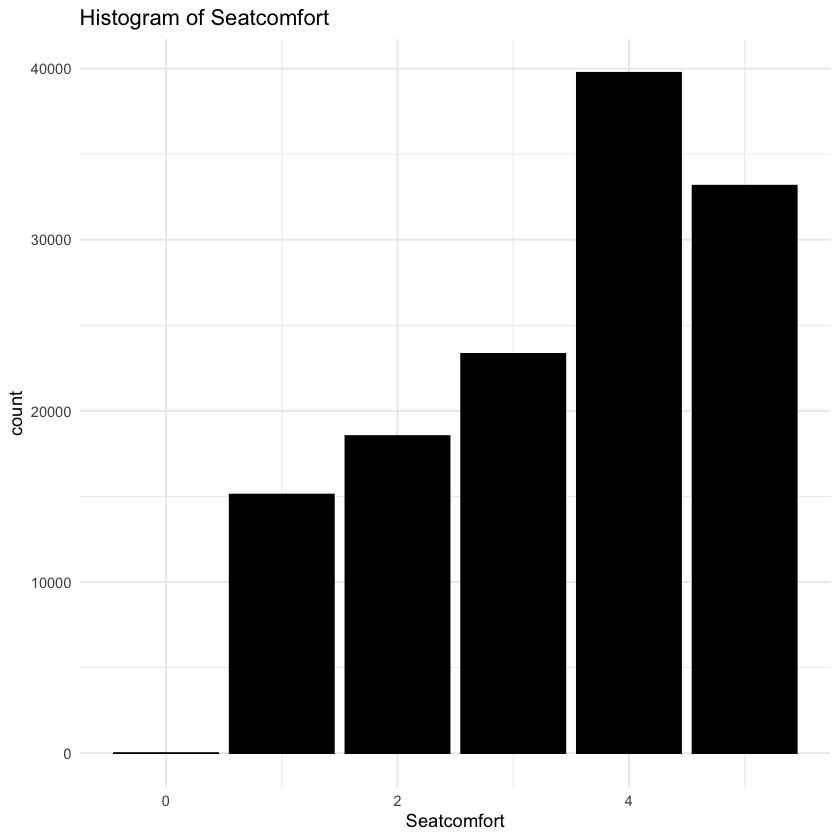


[[15]]


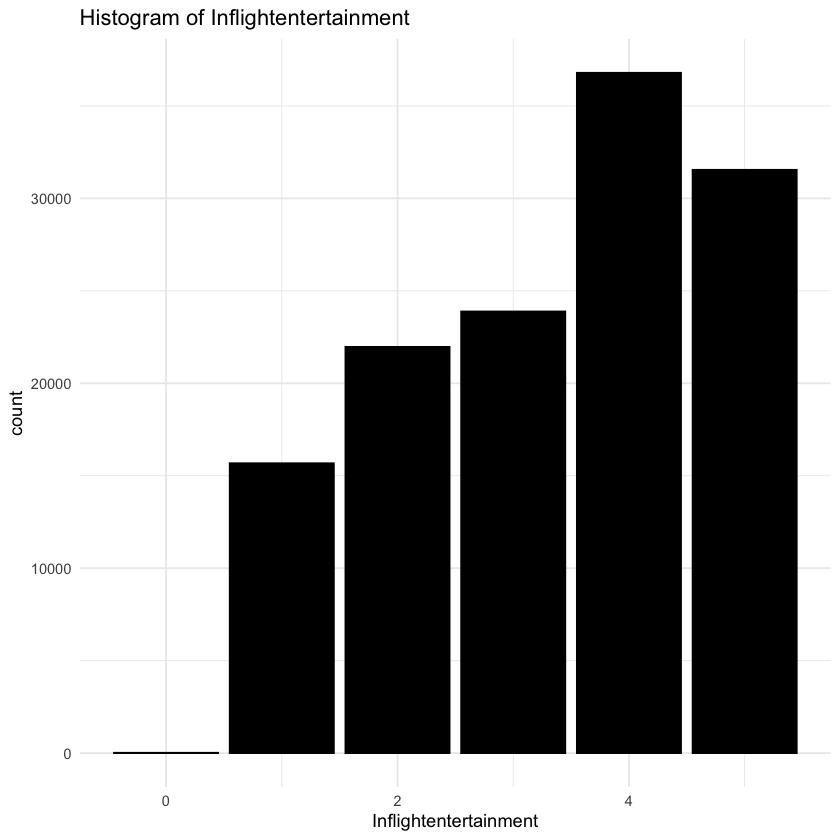


[[16]]


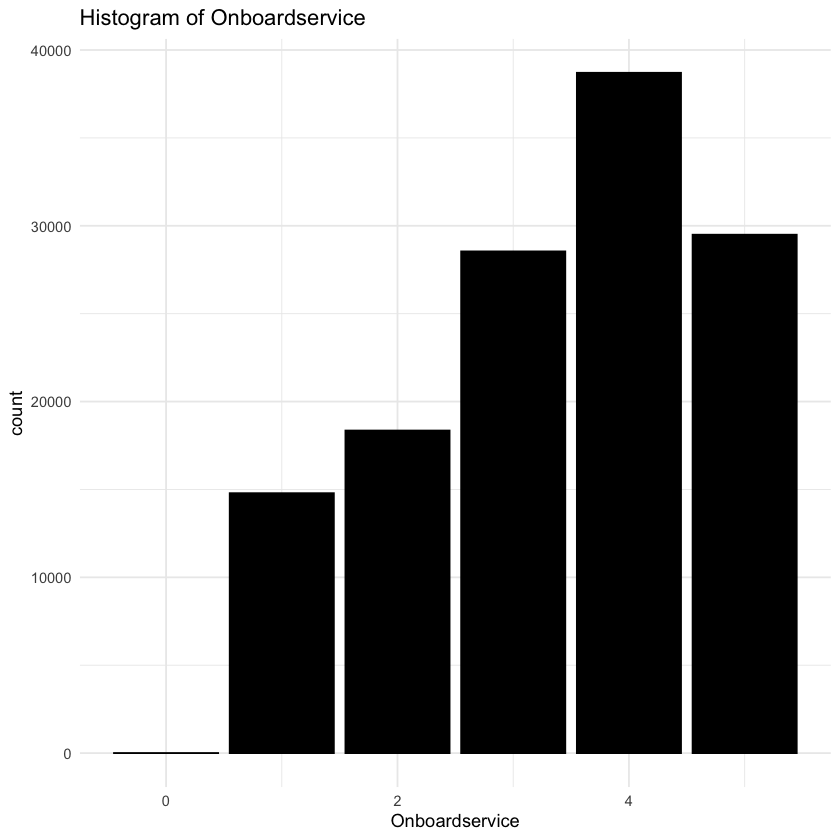


[[17]]


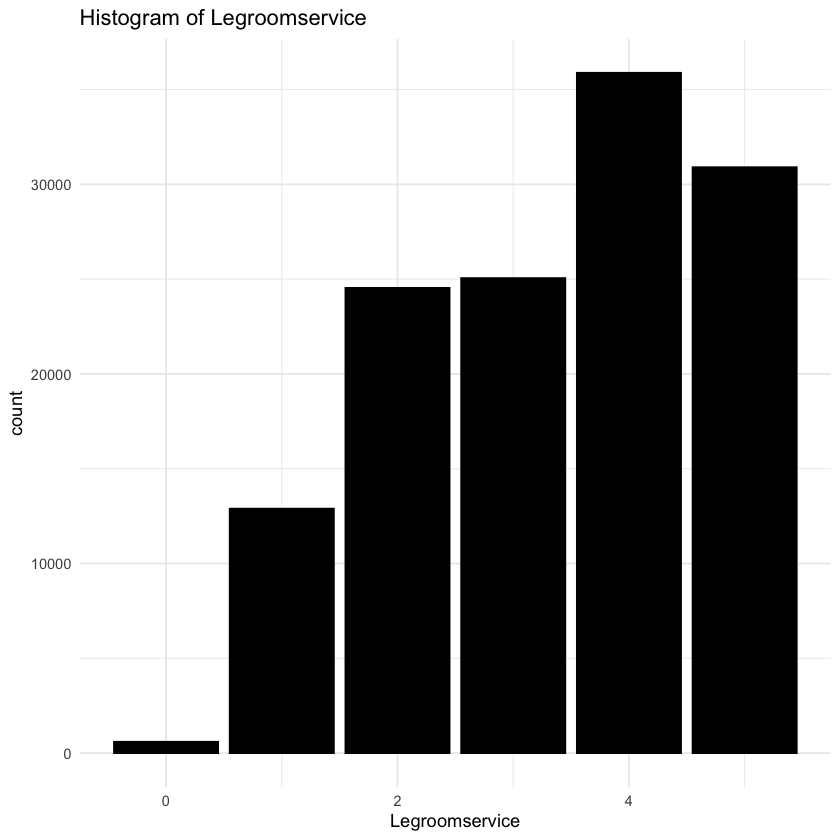


[[18]]


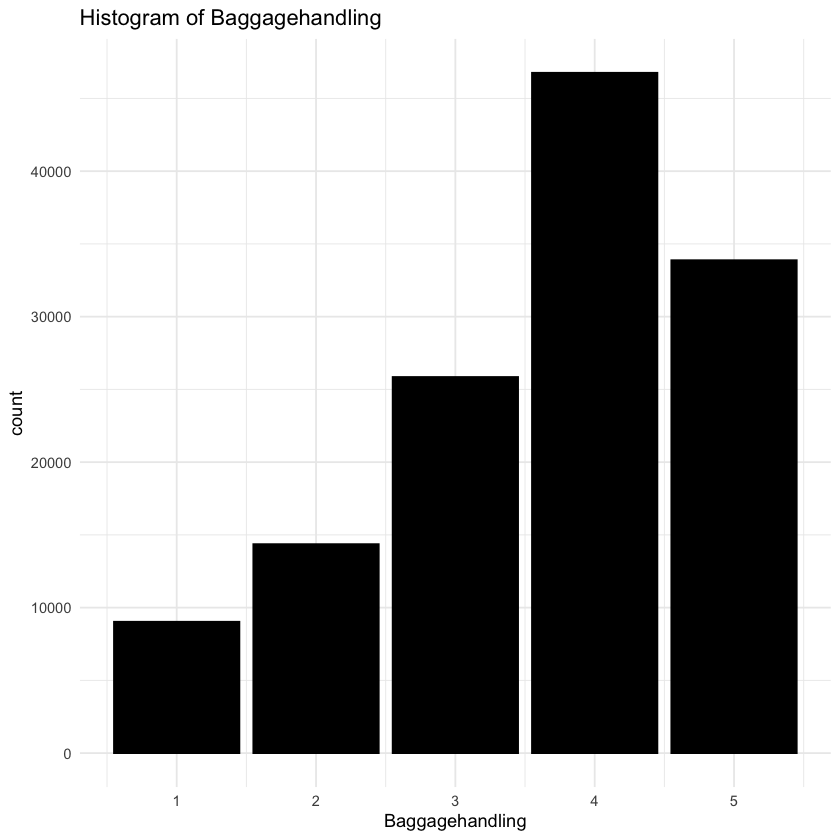


[[19]]


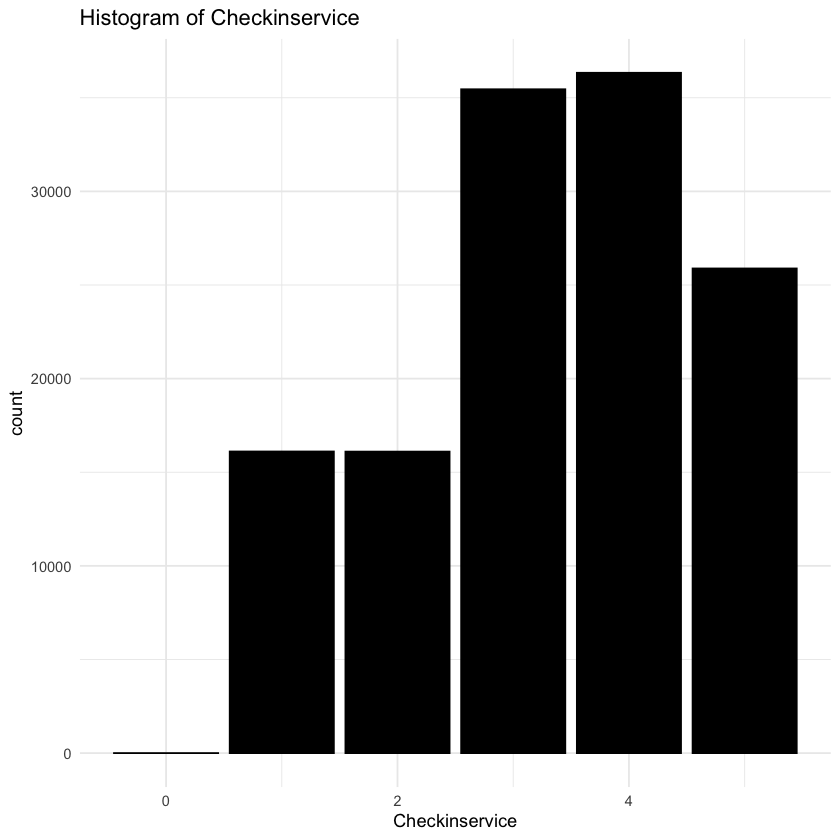


[[20]]


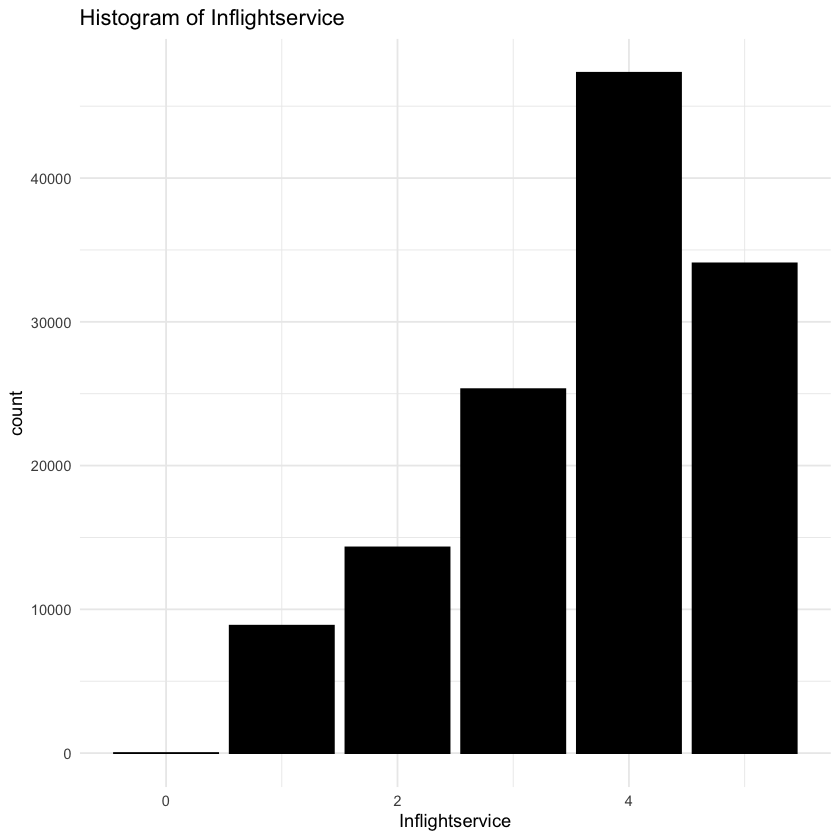


[[21]]


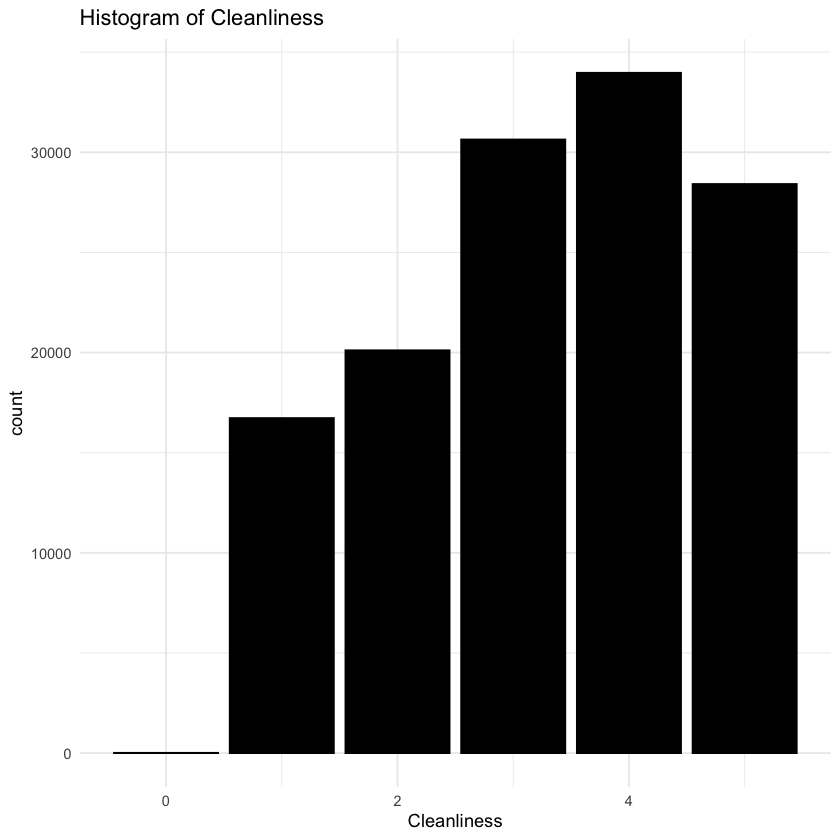


[[22]]


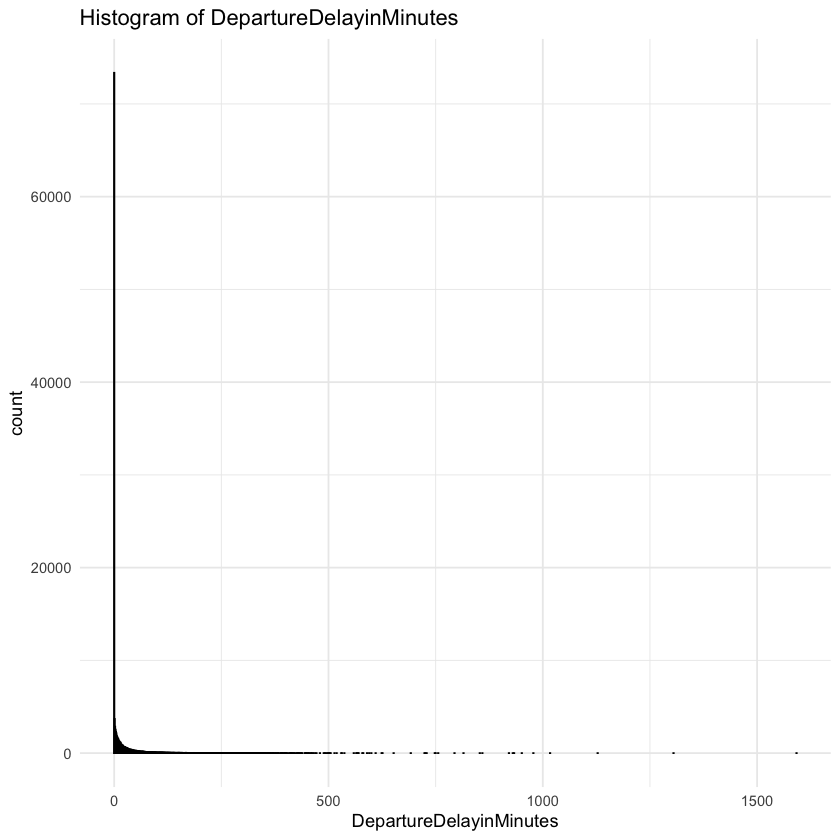


[[23]]


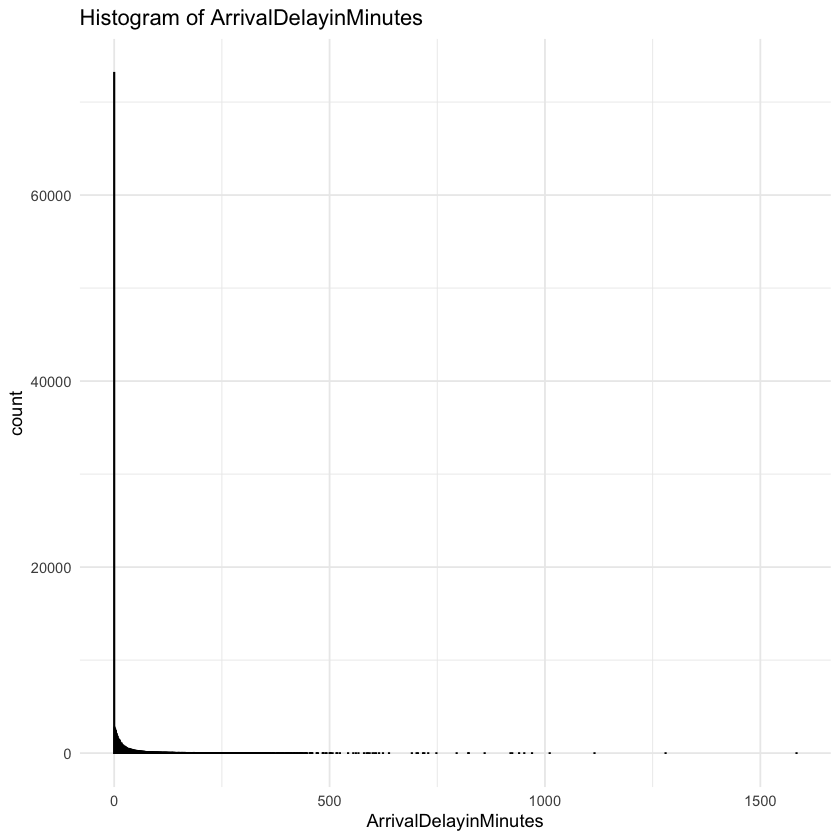

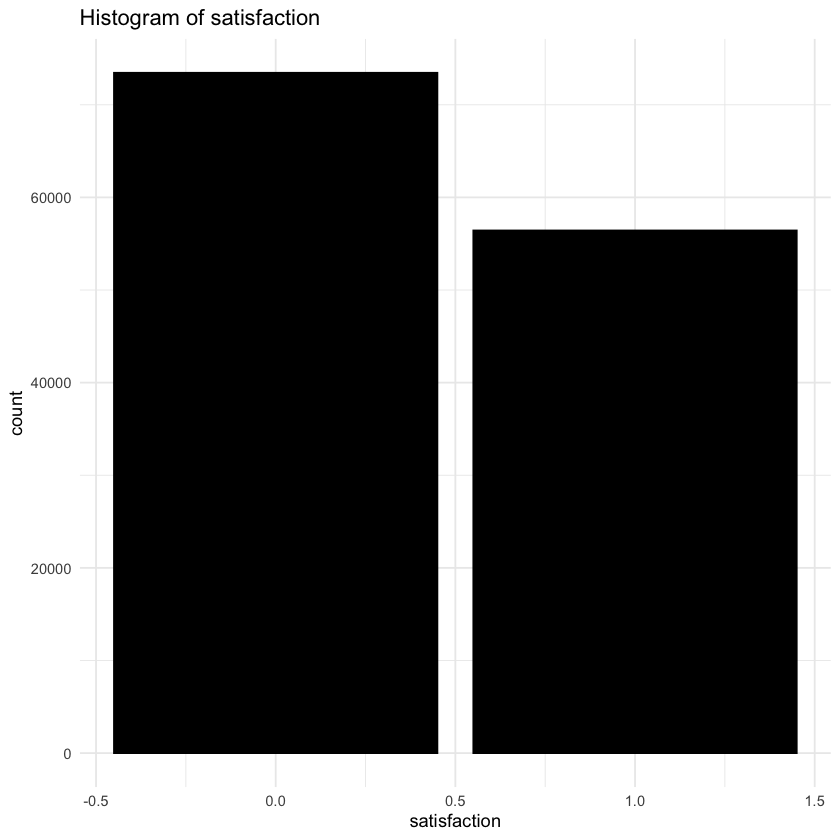

In [41]:
  histPlots <-visualiseHist(data)
  print(histPlots)

### Pairplots - numeric features

In [43]:
pairPlot <- ggpairs(normalized)
print(pairPlot)

ERROR: [1m[33mError[39m in `geom_text()`:[22m
[1m[22m[33m![39m Problem while computing aesthetics.
[36mi[39m Error occurred in the 1st layer.
[1mCaused by error:[22m
[33m![39m object 'X' not found


## Correlations

### Pearson Correlation Plot

In [ ]:
# pearson plot

### Spearman's Correlation, Kendall's Tau

In [ ]:
# the spearman's & kendall's methods

## tSNA & UMAP 3D interactive visualisations

In [56]:
# Run t-SNE
set.seed(42)  # For reproducibility
tsne_result <- Rtsne(normalized, dims = 3, perplexity = 30, max_iter = 500)

# Create a 3D interactive plot using plotly
plot_ly(x = tsne_result$Y[,1], y = tsne_result$Y[,2], z = tsne_result$Y[,3],
        type = 'scatter3d', 
        mode = 'markers', 
        marker = list(color = normalized$satisfaction, colorscale = 'Viridis', size = 5)) %>%
        layout(title = '3D tSNE Plot')

HTML widgets cannot be represented in plain text (need html)

In [58]:
# Run UMAP
umap_result <- umap(normalized, n_components = 3)

# Create a 3D interactive plot using plotly
plot_ly(x = umap_result$layout[,1], y = umap_result$layout[,2], z = umap_result$layout[,3],
        type = 'scatter3d', 
        mode = 'markers', 
        marker = list(color = normalized$satisfaction, colorscale = 'Viridis', size = 5)) %>%
        layout(title = '3D UMAP Plot')

HTML widgets cannot be represented in plain text (need html)

# Outlier Detection - LOF

### Running a loop on this with varying neighbourhood sizes of 10 through 50

Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 11 instead ."


k = 10 : Number of outliers = 50 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 12 instead ."


k = 11 : Number of outliers = 48 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 13 instead ."


k = 12 : Number of outliers = 41 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 14 instead ."


k = 13 : Number of outliers = 38 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 15 instead ."


k = 14 : Number of outliers = 37 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 16 instead ."


k = 15 : Number of outliers = 37 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 17 instead ."


k = 16 : Number of outliers = 35 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 18 instead ."


k = 17 : Number of outliers = 33 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 19 instead ."


k = 18 : Number of outliers = 34 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 20 instead ."


k = 19 : Number of outliers = 33 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 21 instead ."


k = 20 : Number of outliers = 35 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 22 instead ."


k = 21 : Number of outliers = 35 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 23 instead ."


k = 22 : Number of outliers = 34 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 24 instead ."


k = 23 : Number of outliers = 36 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 25 instead ."


k = 24 : Number of outliers = 35 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 26 instead ."


k = 25 : Number of outliers = 34 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 27 instead ."


k = 26 : Number of outliers = 31 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 28 instead ."


k = 27 : Number of outliers = 27 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 29 instead ."


k = 28 : Number of outliers = 26 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 30 instead ."


k = 29 : Number of outliers = 30 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 31 instead ."


k = 30 : Number of outliers = 29 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 32 instead ."


k = 31 : Number of outliers = 25 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 33 instead ."


k = 32 : Number of outliers = 25 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 34 instead ."


k = 33 : Number of outliers = 28 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 35 instead ."


k = 34 : Number of outliers = 26 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 36 instead ."


k = 35 : Number of outliers = 25 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 37 instead ."


k = 36 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 38 instead ."


k = 37 : Number of outliers = 25 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 39 instead ."


k = 38 : Number of outliers = 23 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 40 instead ."


k = 39 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 41 instead ."


k = 40 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 42 instead ."


k = 41 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 43 instead ."


k = 42 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 44 instead ."


k = 43 : Number of outliers = 22 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 45 instead ."


k = 44 : Number of outliers = 23 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 46 instead ."


k = 45 : Number of outliers = 22 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 47 instead ."


k = 46 : Number of outliers = 23 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 48 instead ."


k = 47 : Number of outliers = 24 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 49 instead ."


k = 48 : Number of outliers = 22 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 50 instead ."


k = 49 : Number of outliers = 22 


Warning message in lof(normalized, k = k):
"lof: k is now deprecated. use minPts = 51 instead ."


k = 50 : Number of outliers = 22 


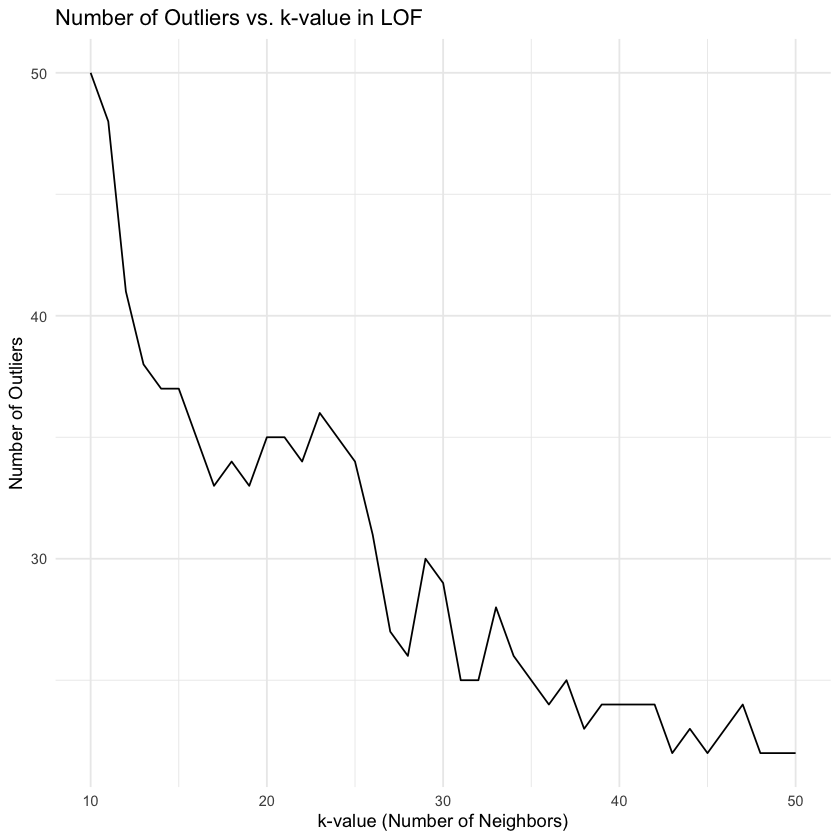

In [79]:
# Outlier detection

# Initialize a dataframe to store outlier indices and corresponding k values
outliers_df <- data.frame(k = integer(), outlier_indices = I(list()))

# Loop over k values from 10 to 50
outlier_counts <- integer()

for (k in 10:50) {
  lof_scores <- lof(normalized, k = k)
  
  # Identifying outliers (e.g., LOF score > 1.5)
  outlier_indices <- which(lof_scores > 1.5)
  outlier_counts[k - 9] <- length(outlier_indices)
  
  # Append to the dataframe
  outliers_df <- rbind(outliers_df, data.frame(k = k, outlier_indices = I(list(outlier_indices))))
  
  # Print the number of outliers for the current k
  cat("k =", k, ": Number of outliers =", length(outlier_indices), "\n")
}

# Plotting the curve of the number of outliers against each k value
ggplot(data = data.frame(k = 10:50, outliers = outlier_counts), aes(x = k, y = outliers)) +
  geom_line() +
  theme_minimal() +
  labs(title = "Number of Outliers vs. k-value in LOF",
       x = "k-value (Number of Neighbors)",
       y = "Number of Outliers")

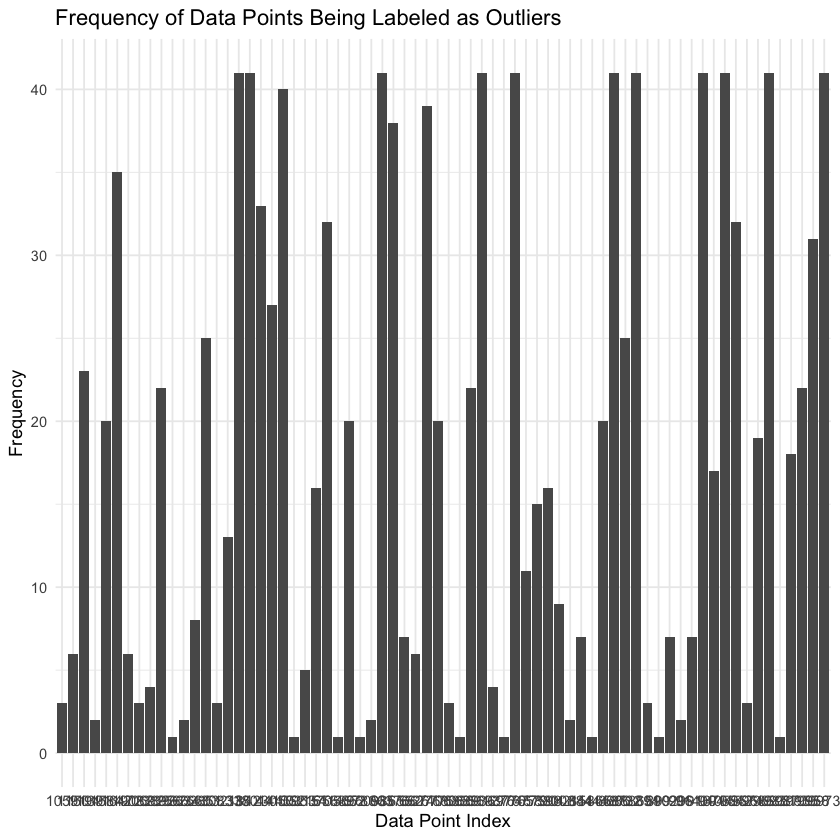

In [99]:
# Create a vector to hold the frequency of each index appearing as an outlier
index_frequencies <- list()

# Loop through each column in outliers_df to tally the outlier indices
for (k_value in 1:nrow(outliers_df)) {
  # each cell in the dataframe is a list of indices
  indices_list <- unlist(outliers_df[k_value, 2])
  for (idx in indices_list) {
    # Convert index to character to use as a name in the list
    index_char <- as.character(idx)
    if (index_char %in% names(index_frequencies)) {
      index_frequencies[[index_char]] <- index_frequencies[[index_char]] + 1
    } else {
      index_frequencies[[index_char]] <- 1
    }
  }
}

# Create a dataframe for plotting
frequency_df <- data.frame(Index = names(index_frequencies), Frequency = sapply(index_frequencies, identity)) %>%
  arrange(desc(Frequency))


# Plot the frequency of outlier indices
ggplot(frequency_df, aes(x = Index, y = Frequency)) +
  geom_bar(stat = "identity") +
  theme_minimal() +
  labs(title = "Frequency of Data Points Being Labeled as Outliers",
       x = "Data Point Index",
       y = "Frequency")

In [101]:
plateau_outliers <- frequency_df[1:22,]

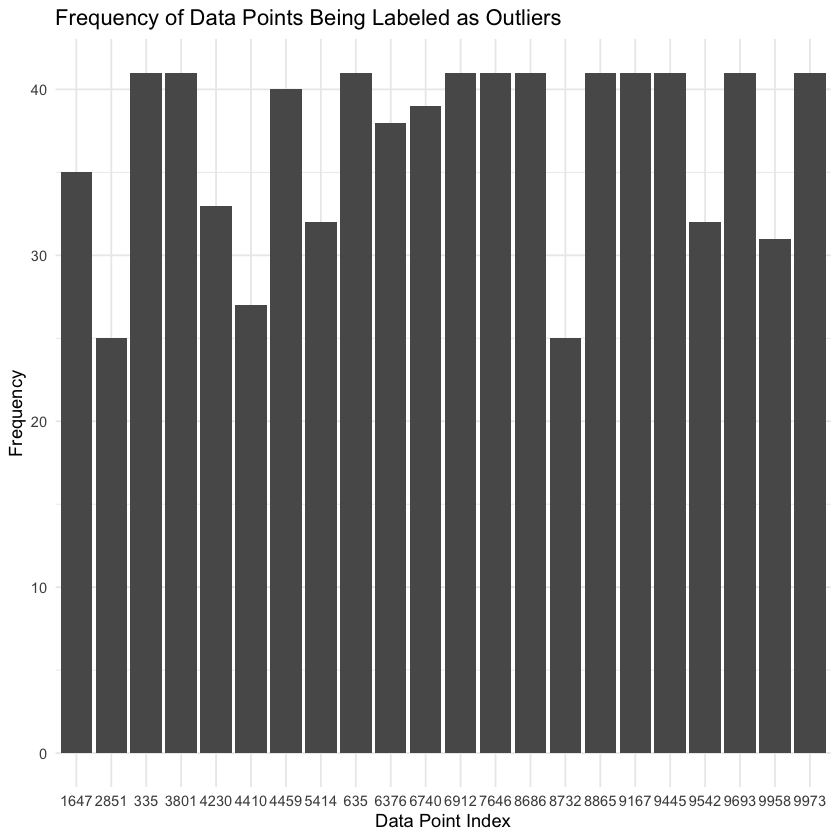

In [102]:
# Plot the frequency of outlier indices
ggplot(plateau_outliers, aes(x = Index, y = Frequency)) +
  geom_bar(stat = "identity") +
  theme_minimal() +
  labs(title = "Frequency of Data Points Being Labeled as Outliers",
       x = "Data Point Index",
       y = "Frequency")

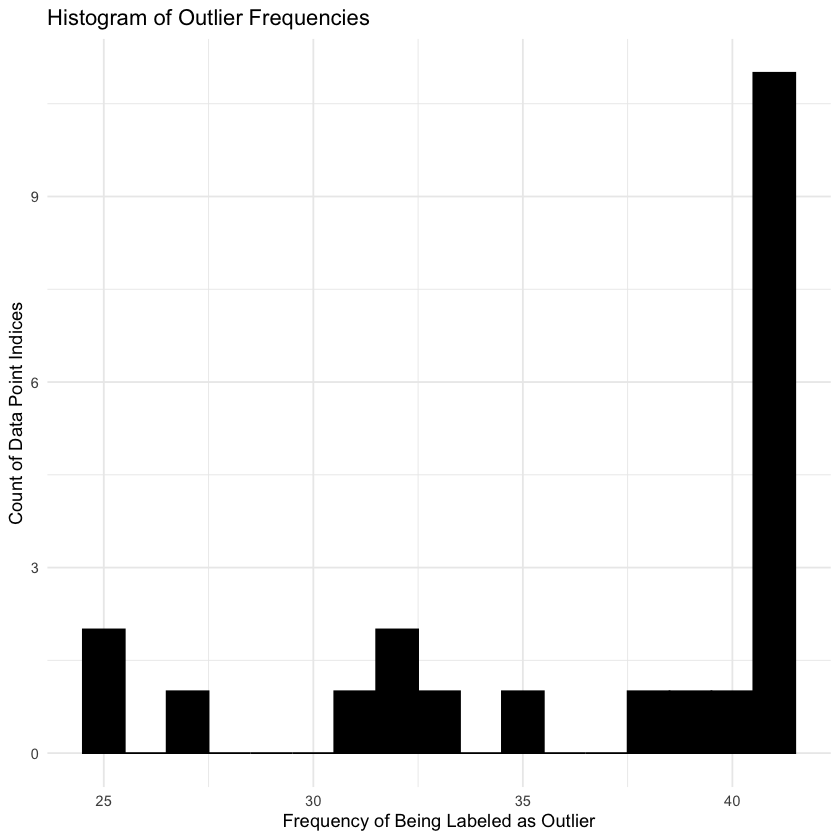

In [105]:

# Alternatively, if the number of different indices is too large for a bar plot to be informative,
# you can use a histogram to show the distribution of frequencies
ggplot(plateau_outliers, aes(x = Frequency)) +
  geom_histogram(binwidth = 1, fill = "black", color = "black") +
  theme_minimal() +
  labs(title = "Histogram of Outlier Frequencies",
       x = "Frequency of Being Labeled as Outlier",
       y = "Count of Data Point Indices")

# Dimensionality Reduction

## PCA, CATPCA, MCA

In [ ]:
# PCA, CATPCA, MCA

In [ ]:
# Scree plots, visualisation of principal components,
# cumulative variance explained

## Autoencoder dim reduction

In [ ]:
# autoencoder implementation of varying latent space size

### UMAP & tSNE visualisations post autoencoder

In [ ]:
# umap & tsne

# Classification

## DNN w/ Grid Search

In [ ]:
# DNN

## SVM

In [ ]:
# SVM

# Compare Model Metrics

In [ ]:
# model metrics

In [70]:
# ************************************************
# main() :
# main entry point to execute analytics
#
# INPUT : None
#
# OUTPUT : None
#
# ************************************************
main<-function(){

  print("Inside main function")

  # read in data and combine
  data <- readData(TRAIN_FILENAME, TEST_FILENAME)

  # ************************************************
  # EDA
  # ************************************************
  print("Starting EDA")

  # descriptive summary of structure & statistics
  # pre-encoding of categoricals
  #str(data)
  #summary(data)
  NPREPROCESSING_prettyDataset(data)

  # check missing values
  #missing_values_summary <- colSums(is.na(data))
  #print(missing_values_summary)

  # check proportion of missing vals in each column
  #missing_percentage <- colSums(is.na(
  #  data)) / nrow(data) * 100
  #print(missing_percentage)

  # visualise missing values
  #aggr_plot <- VIM::aggr(data, col=c('navyblue','red'), numbers=TRUE,
                         #sortVars=TRUE,
                         #labels=names(data),
                         #cex.axis=.7,
                         #gap=3,
                         #ylab=c("Histogram of missing data","Pattern"))
  #print(aggr_plot)


  # deal with missing values

  # determine number of unique values of each field
  #getUniqueValues(data)

  # determine field types
  #fieldTypes<-getColumnTypes(data)

  # display descriptive statistics
  #NPREPROCESSING_prettyDataset(data)

  # visualise discrete data
  #fieldTypes1<-NPREPROCESSING_discreteNumeric(dataset=data,
  #                                            field_types=fieldTypes,
  #                                            cutoff=DISCRETE_BINS)
  
  #print("Field types after discrete-binning:/n")
  #print(fieldTypes1)

  #results<-data.frame(field=names(data),initial=fieldTypes,types1=fieldTypes1)
  #print(formattable::formattable(results))

  # VISUALISATIONS NOT WORKING BECAUSE DATASET TOO LARGE
  # ---------------------------------------------------
  # visualise distributions of data
  #histPlots <-visualiseHist(data)
  #print(histPlots)

  # importance of each field via randomforest


  # enhanced visualisation of distribution, correlation
  # and plot of pairs
  #pairPlot <- ggpairs(data)
  #print(pairPlot)

  # heatmap of correlations
  #correlationMatrix <- cor(data %>% select(where(is.numeric)),
                           method = "pearson")
  #corrplot(correlationMatrix, method = "color", type = "upper",
           #order = "hclust", tl.col = "black", tl.srt = 45)


  # ************************************************
  # PRE-PROCESSING & VISUALISATION
  # ************************************************

  # encode categoricals
  #data <- encodeCategoricals(data)

  # standardise/scale data

  # outlier analysis
  # naive
  #ordinals<-data[,which(fieldTypes1==TYPE_ORDINAL)]
  #ordinals<-NPREPROCESSING_outlier(ordinals=ordinals,confidence=OUTLIER_CONF)

  # LOF outlier removal compared to Random Forest



  # descriptive summary of structure & statistics
  # post-encoding of categoricals
  #str(data)
  #summary(data)

  # outlier removal

  # visualisation of outlier removal

  # if linear relationships, PCA & potentially MCA or
  # CATPCA, 80%/85% Var. Exp.

  # compare with autoencoder

  # compare with t-SNE and UMAP

  # ************************************************
  # MODELLING, METRICS & VISUALISATIONS - DIFFERENT FILE
  # ************************************************

  # Deep VAE for clustering

  # HDBScan or Kmeans depending on data

  print("Leaving main")

}
# ************************************************



# ************************************************
main()
print("End of EDA")

ERROR: Error in parse(text = x, srcfile = src): <text>:85:46: unexpected ')'
84:   #correlationMatrix <- cor(data %>% select(where(is.numeric)),
85:                            method = "pearson")
                                                 ^
